greatlearning-brand (1).svg

Proprietary content. © Great Learning. All Rights Reserved. Unauthorized use or distribution prohibited.

# Table of Contents
- Introduction
- Requirements
- Installation & Setup
- AWS Kinesis: Create Data Stream
- AWS IoT Core: Create a Rule for Kinesis stream
- Create local consumer for Kinesis stream and detect anomalies
- Store anomalies in DynamoDB table

# Introduction

In the previous notebook we looked at Bed Side Monitor example. In this notebook, we will build on top of that.

In this notebook, we will focus on:
- Connecting AWS IoT core with AWS Kinesis Data Stream
- Writing a local python consumer to get data from data stream
- Creating rules to detect anomaly in the readings
- Storing anomalies in DynamoDB

## Requirements
### Files
- BedSideMonitor.py
- Private key file
- Certificate for thing
- A root CA for AWSIoT
- local_consumer.py
- consumer_and_anomaly_detector.py
- consume_and_update.py

### Python Libraries
- AWSIoTPythonSDK
- awsiotsdk
- boto3

### Software/Tool
- AWS Command Line Interface

# Installation & Setup
Before we start, lets make sure we have all things setup.

## AWS Command Line Interface
1. **Download and Install:** Go to https://aws.amazon.com/cli/ and download and install AWS CLI software for your OS.
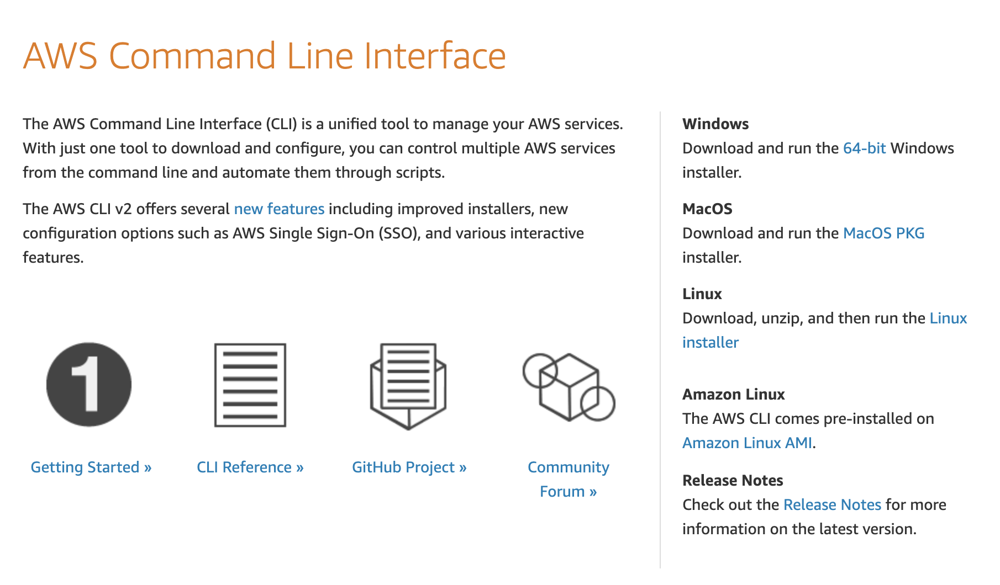

2. **Configure AWS CLI:**
- Open the `credentials` file. The `credentials` file is located at `~/.aws/credentials` on Linux or macOS, or at `C:\Users\USERNAME\.aws\credentials` on Windows. This file can contain the credential details for the default profile and any named profiles.

Once you are done with the cli setup you need to save these credentials as configuration. Look at the next steps to complete the setup.  

- You will get the access for these services once you logged in into the account. This data will be available at the nuvepro page where your ARN is available for you to access. As you can see the below attached screenshot there are some keys available. Here is the mapping for you to utilize them in your code. 

* Here accessid → AWS Access Key ID
* accesskey → AWS secret access key

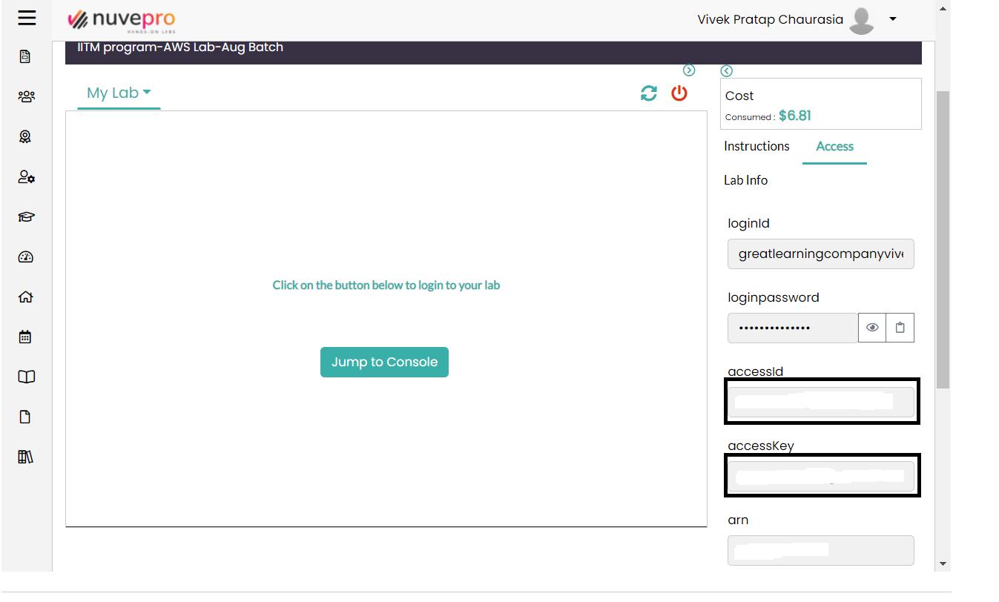

- As a last step for configuration we need to add these keys into your local machine at the above mentioned folder. You can navigate to the directory and add the values: 


- You also need to add the region in this file. region=us-east-1 

- You can also configure AWS CLI using `aws configure` command. Read more about it here https://docs.aws.amazon.com/cli/latest/userguide/cli-configure-quickstart.html

# AWS Kinesis: Create Data Stream
Amazon Kinesis makes it easy to collect, process, and analyze data streams in real time, so you can get timely insights and react quickly to new information.

1. Open AWS Kinesis
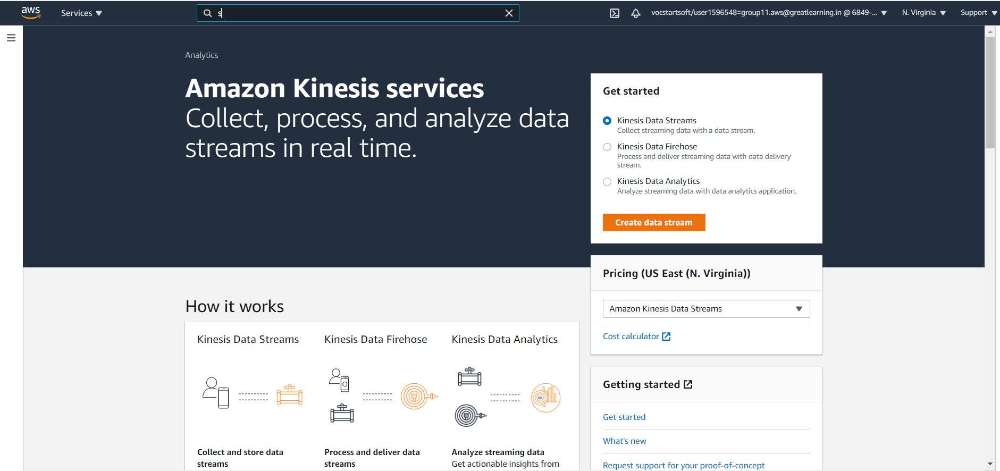

2. Create a data stream
- Enter a Data stream name
- Specify number of open shards: 1 would be enough in our case
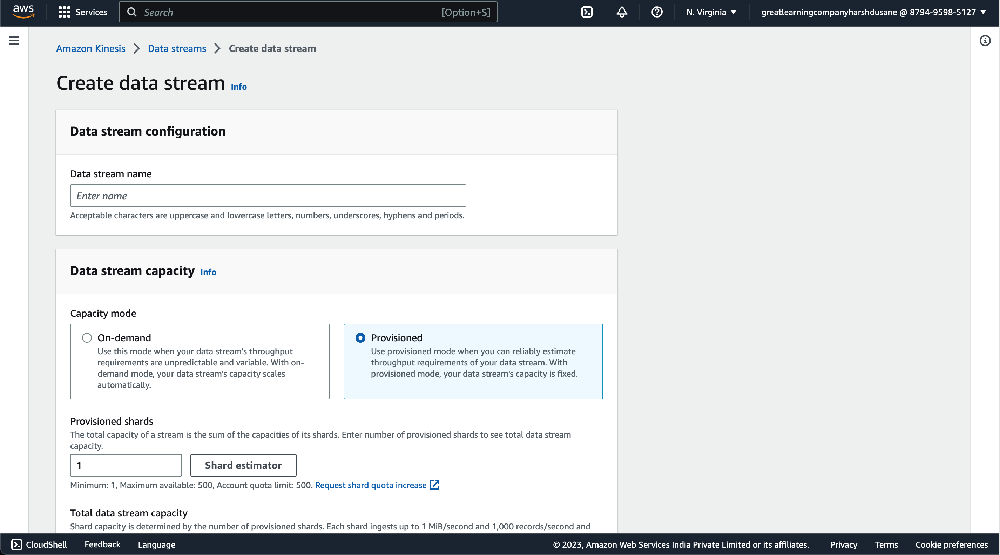

- After you click `Create data stream` below page will appear
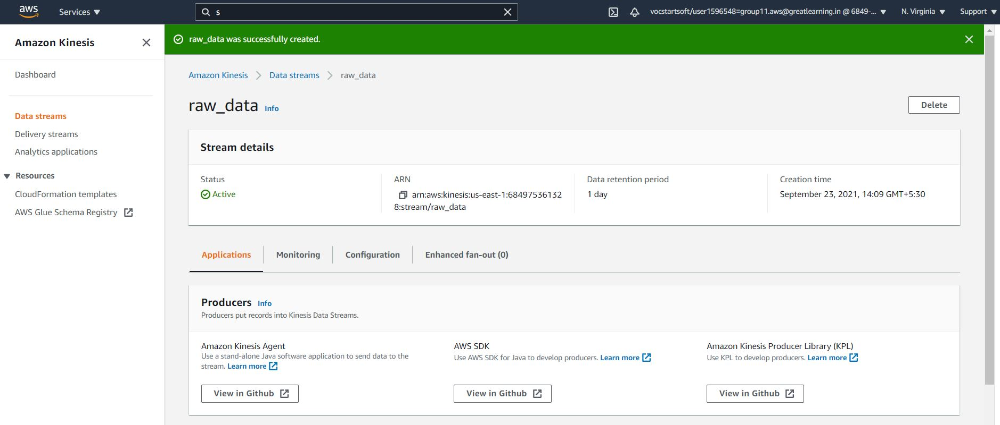



# AWS IoT Core: Create a Rule for Kinesis stream

Before we go ahead with rule creation to push IoT data into lambda function, lets create the role that should have permission to perform this operation. 

1. Goto IAM and click on Create role, choose IoT as shown in the below figure. 

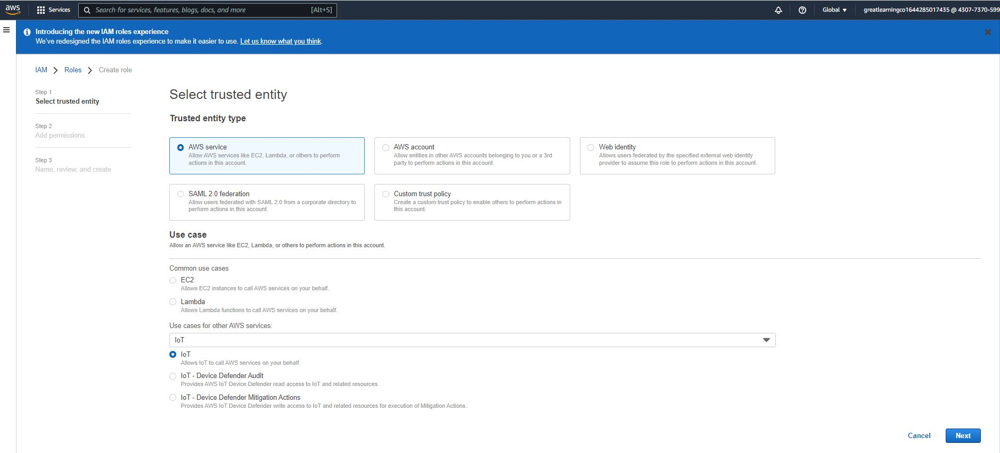

2. Click on Next and do not add any more permission as of now. You can add more once the role is created if required. 

3. Give this role a name and make sure that it is created and available for accessing. 

Now we will create a rule and link the AWS Kinesis stream with AWS IoT Core

1. Go to `AWS IoT Core` page >> click on  `Mesaage Routing` >> click on `Rules` >> click `Create Rule` button

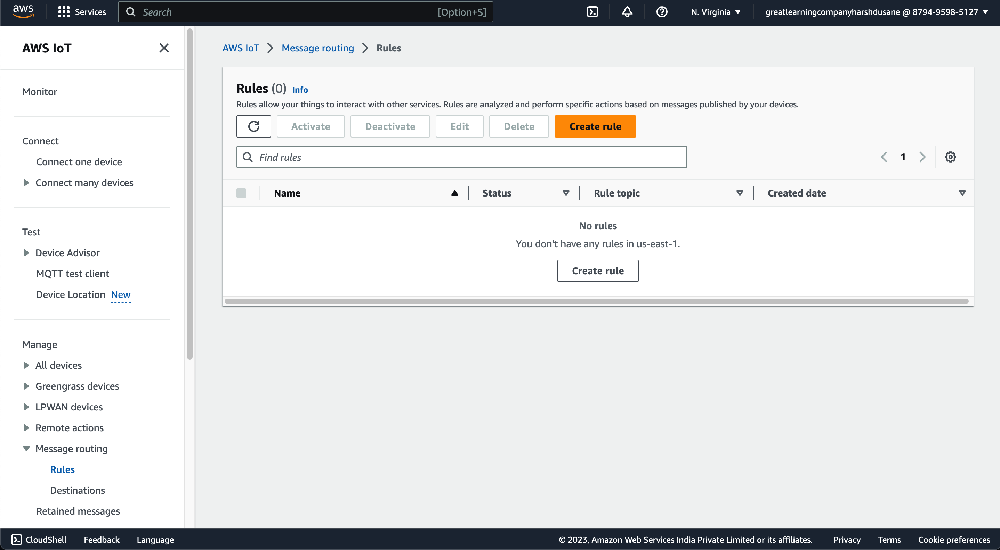

2. In `Create Rule` page specify the Name of your rule

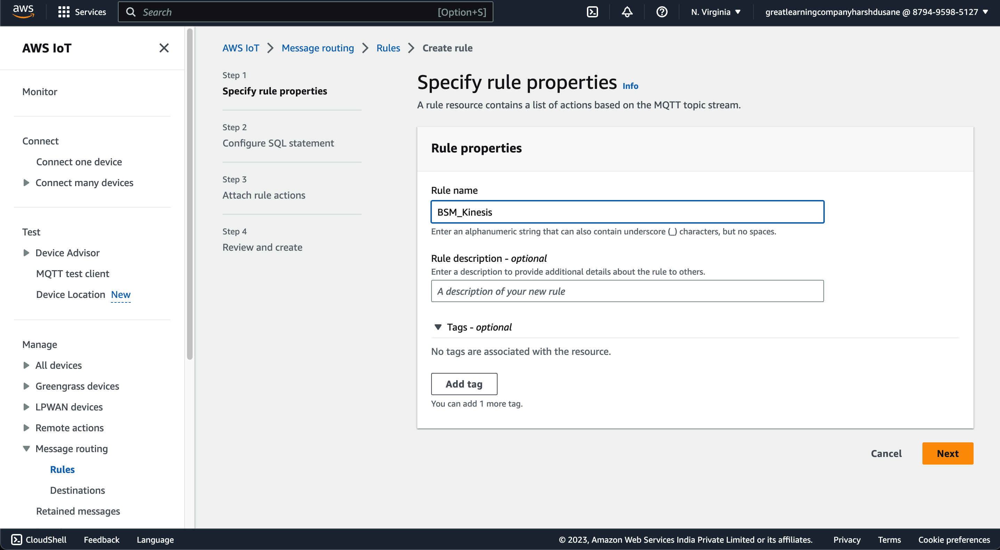

3. Click on `Next` and configure the SQL Statement. Mention SQL Version and the SQL Statement as shown below.

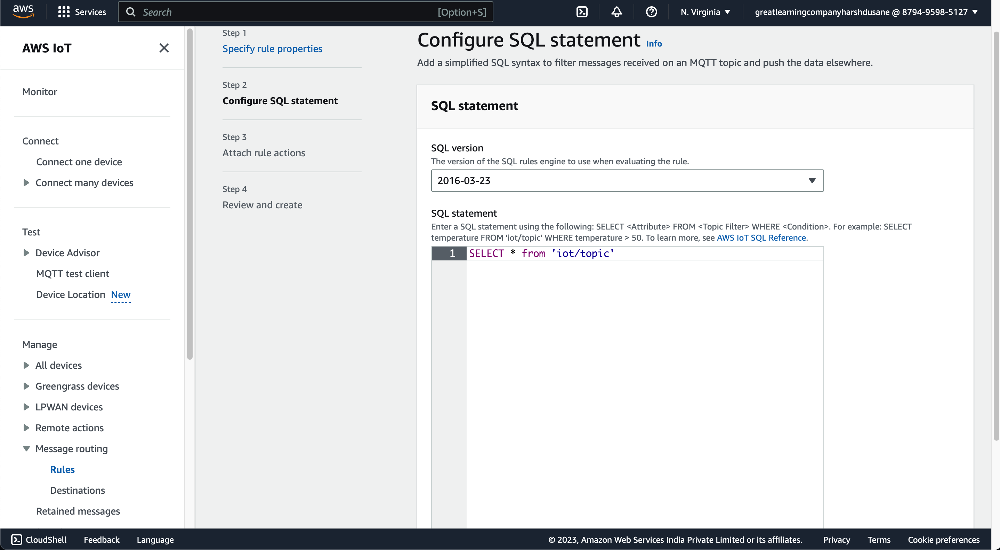

4. Configure `Rule Action` and Select `Kinesis Data Stream` as shown below.

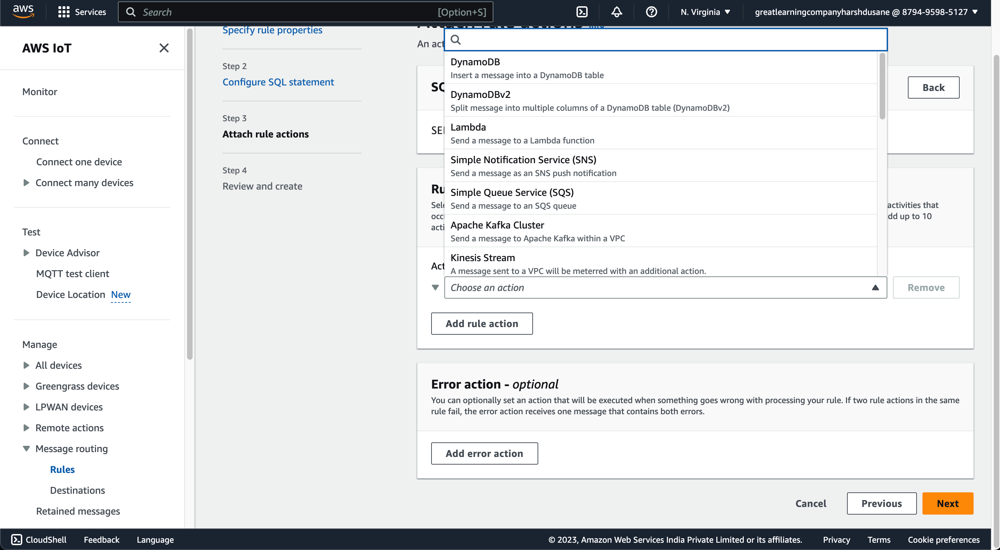

5. Mention `Stream Name`, `Partition Key` and `IAM Role`. If `IAM Role` is not created then create one for accessing `Kinesis`.

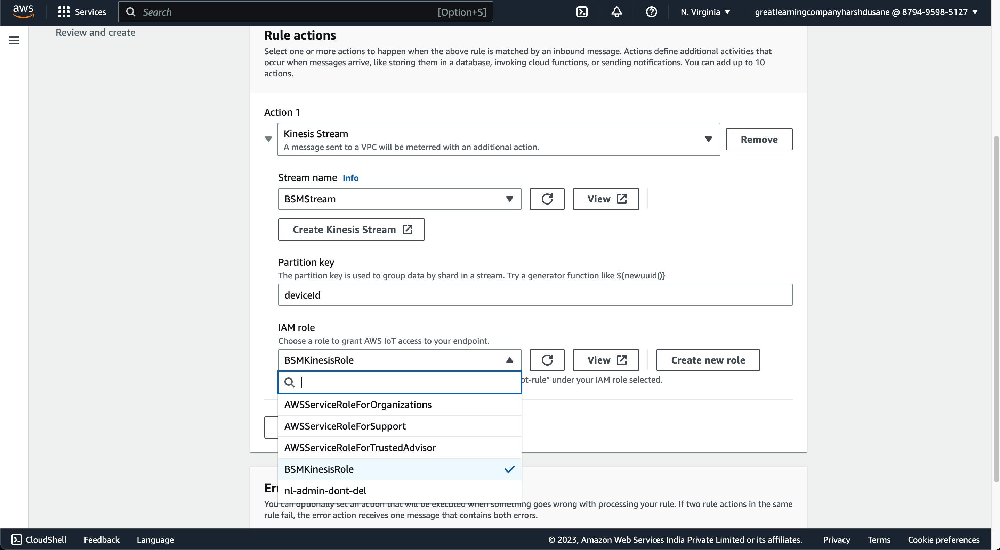

6. Review the rule details and click on `Create`.

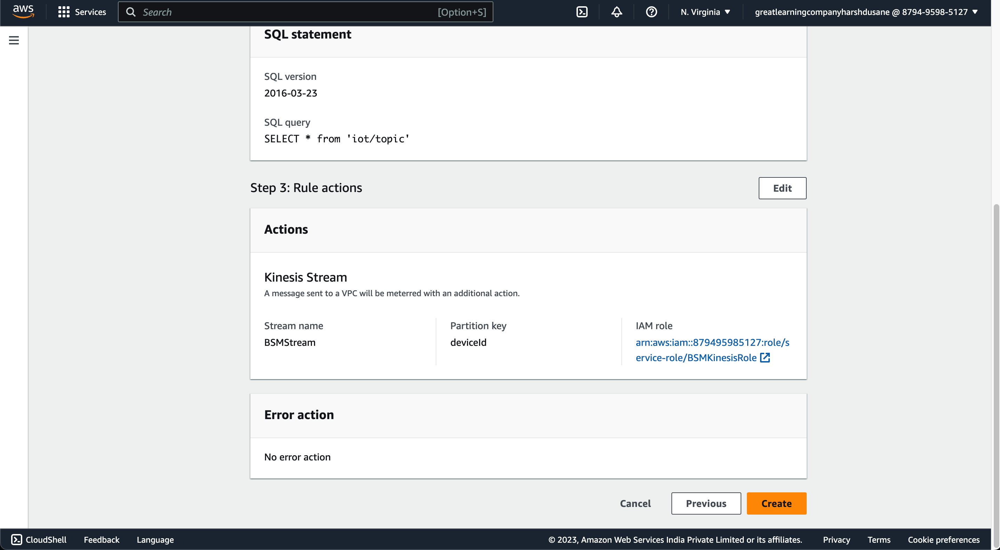

7. Upon successful creation of rule, newly created rule will be displayed as shown below in the `Rules` listing page.

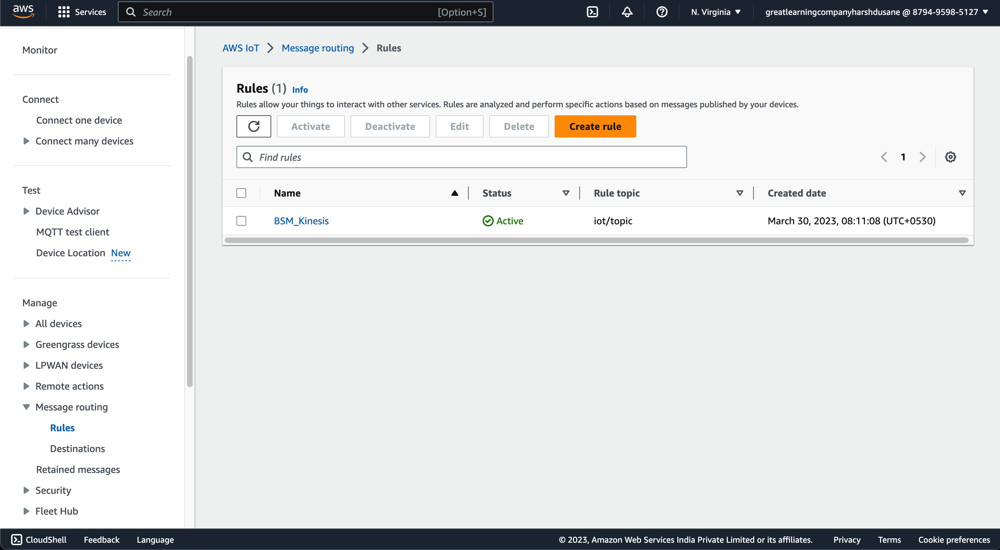

# Create local consumer for Kinesis stream and detect anomalies
We have linked AWS IoT core with Kinesis stream. Now, we will run our BedSideMonitor to do data simulation and consume the data locally using Kinesis data stream

**NOTE: Make sure you change the Thing name in `BedSideMonitor.py` file with the Thing name you created in AWS IoT Core.**

**(Statement - `message['deviceid'] = 'BSM_G101'`)**
1. Run BedSideMonitor.py program
- Command details - python BedSideMonitor.py -e endpoint -r Root_certificate -c Thing_Certificate -k Thing_private_key -id clientid -t topic_name
- Sample command - `python BedSideMonitor.py -e a2yi6n1teb5l2d-ats.iot.us-east-1.amazonaws.com -r root-CA.cer -c 5a4e215a7c-certificate.pem.crt -k 5a4e215a7c-private.pem.key -id client001 -t iot/bsm`
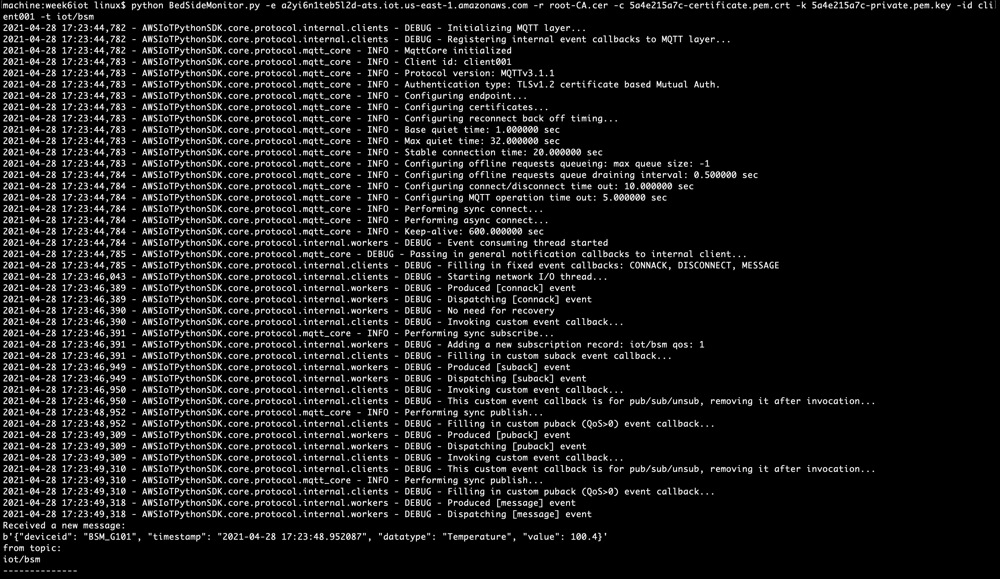



2. As the BedSideMonitor is running, now lets run our local consumer and get the data. Run `local_consumer.py`

**NOTE : Make sure you update the `StreamName` variable value in `local_consumer.py` file with the name of Data stream you created in AWS Kinesis.**

**(Statement -  `StreamName='raw_data'`**)

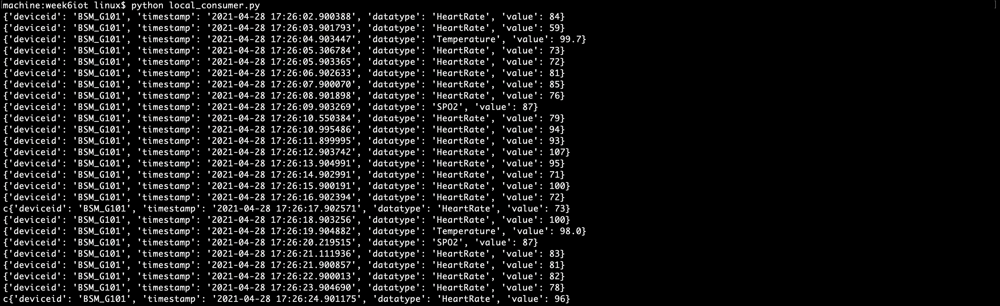

3. Run the program to detect anomalies in the data. Run `consumer_and_anomaly_detector.py`

**NOTE : Make sure you update the `StreamName` variable value in `consumer_and_anomaly_detector.py` file with the name of Data stream you created in AWS Kinesis.**

**(Statement -  `StreamName='raw_data'`**)

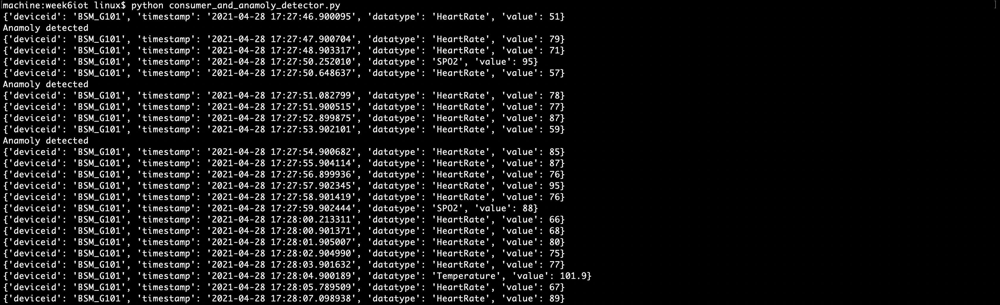

# Create a table in DynamoDB
As we have listed out anomalies in the data. We will have to store it. We will create a table to store anomalies in DynamoDB

1. In AWS go to DynamoDB >> Create table
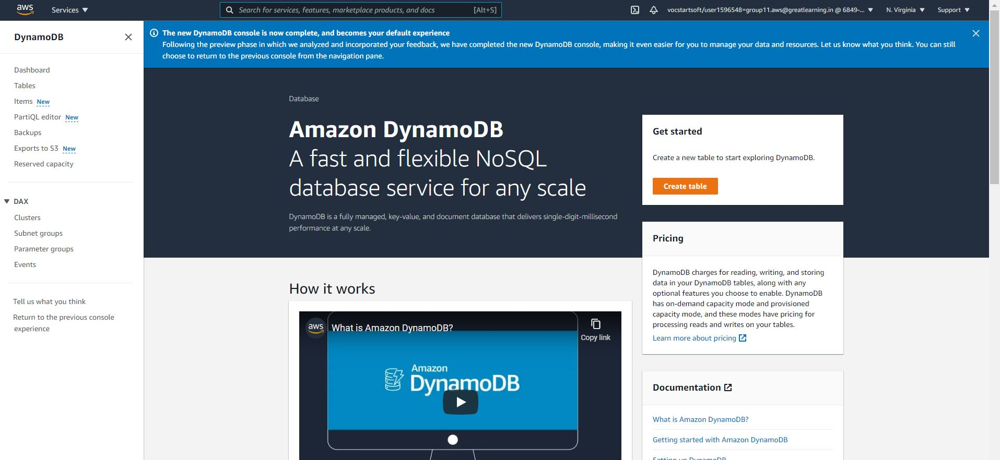



2. In this page enter the details such as table_ name, partition key and sort key. Here we have provided partition key as deviceid & sort key as timestamp. Here combination of deviceid & timestamp will become Primary key.

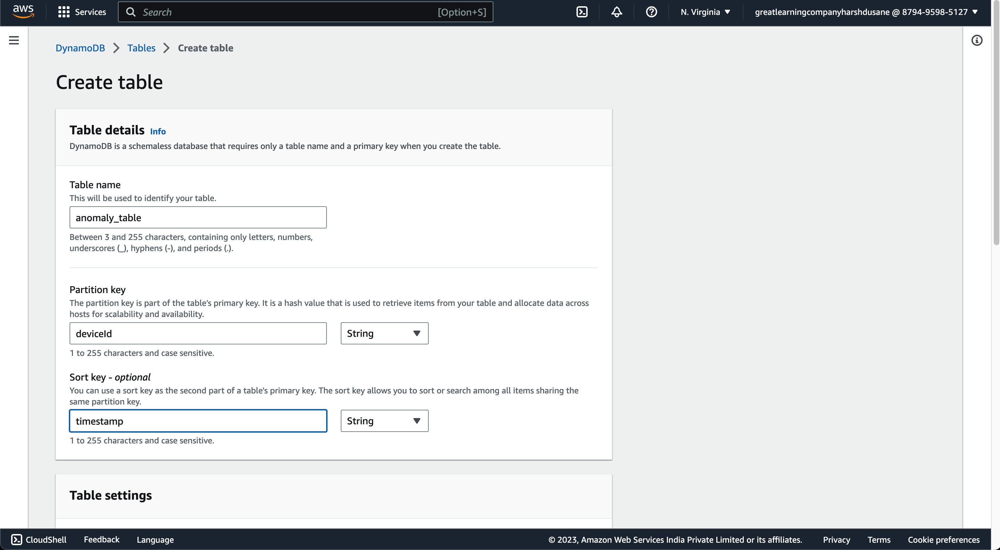

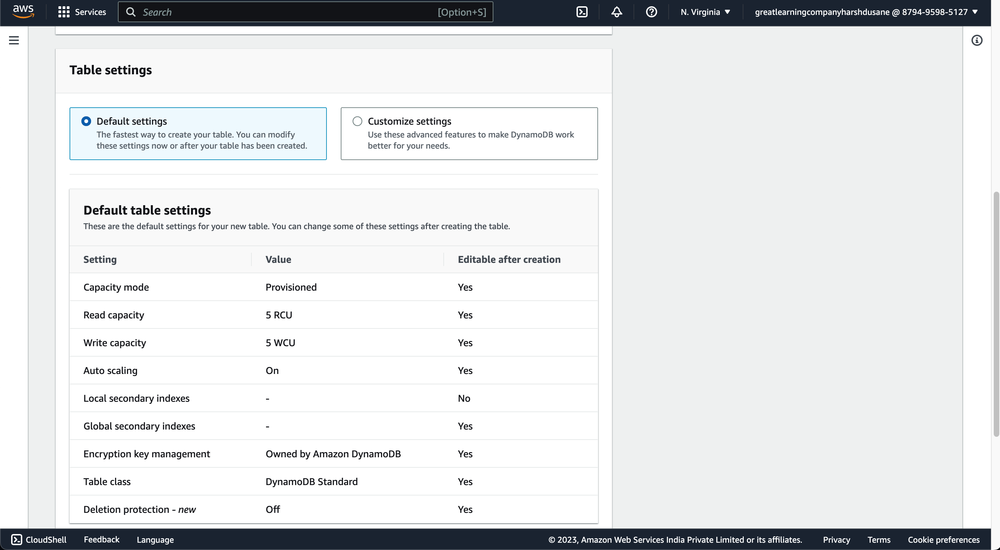

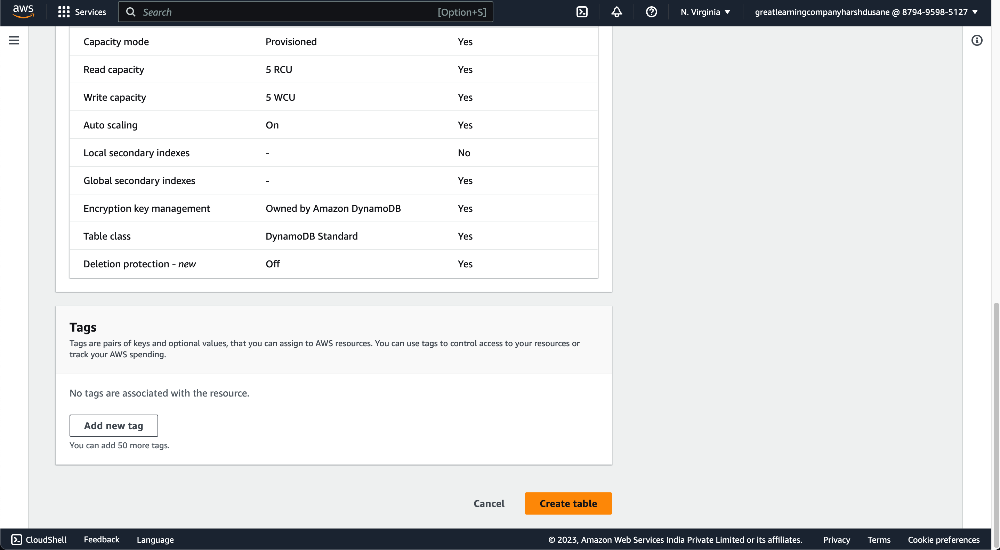

3. Successful table creation in DynamoDB will appear as mentioned in the following image.

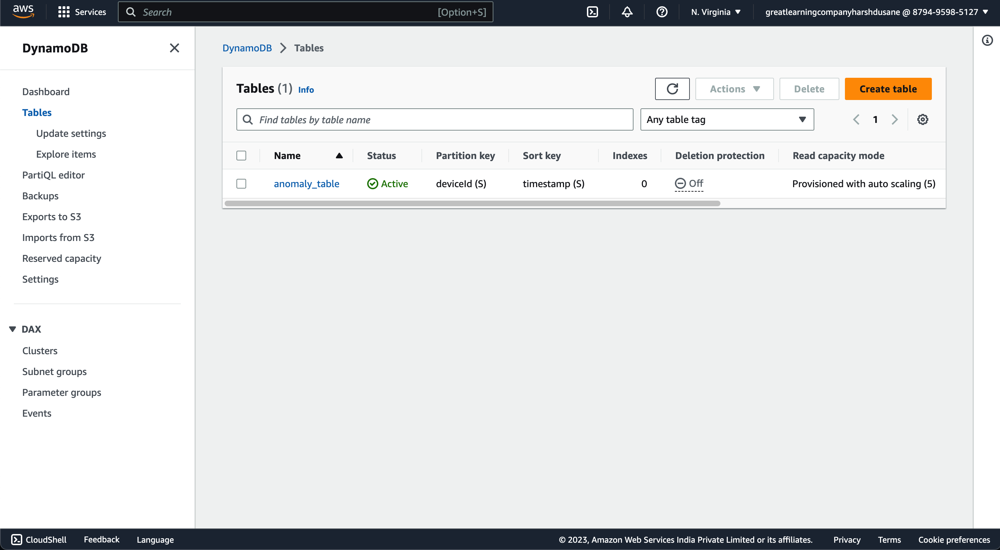

# Store anomalies in DynamoDB table
As we have created a table in DynamoDB to store anomalies. Let's store the anomalies from BedSideMonitor in the table.

1. Make sure BedSideMonnitor is runnning.
2. Run the program to update anomalies in the table. Run `consume_and_update.py`

**NOTE 1 : Make sure you update the `StreamName` variable value in `consume_and_update.py` file with the name of Data stream you created in AWS Kinesis.**

**(Statement -  `StreamName='raw_data'`**)

**NOTE 2 : Make sure you update the table name in the `consume_and_update.py` file with the table you created in DynamoDB.**

**(Statement - `table = dynamodb.Table('anomaly_data')`)**

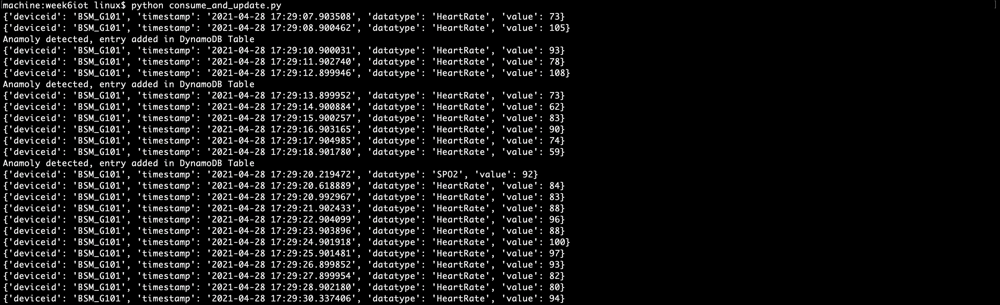



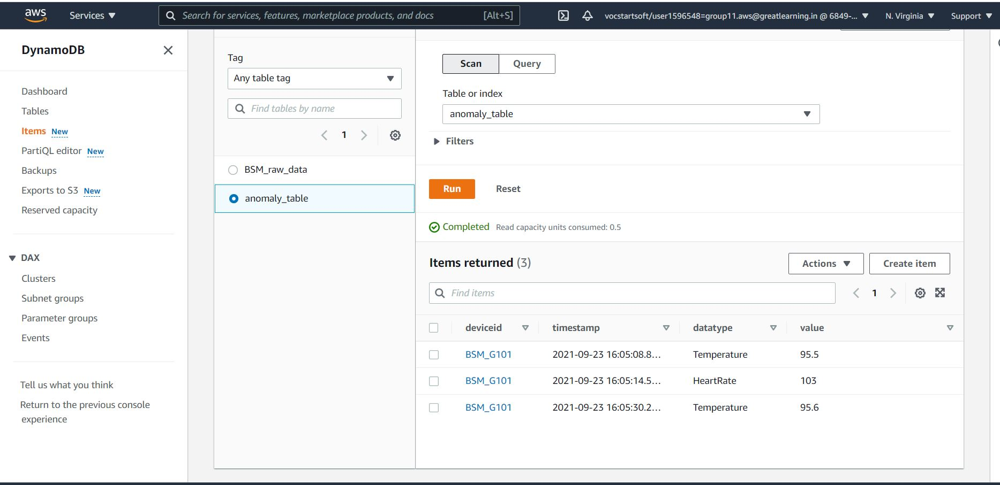

This collected data can now be used periodically for batch processing and analytics using a variety of tools.

Generally, your consumers will also be running in the cloud in an EC2 instance or a lambda function. We'll look at one such setup in the cloud module using Lambda as the consumer reading from Kinesis data analytics stream.

# <font color='blue'> Important </font>

Once you have completed the lab and involved practice exercise, please do the following: 

1. Delete the DB instance that is used store the raw data. This service is very costly and will consume alot of credit from the AWS account. 
2. You can keep things and policies as it is because they do not consume alot of credit. 
3. You should also delete the rules and roles you have created to push raw data into DB. 
4. To access the roles that you created, search IAM on the console, look for Roles and search with the name that you used to create the role.
5. **DELETE KINESIS STREAM**: Delete the kinesis stream after using it. This is a costly service and it will consume alot of credit.
